In [1]:
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap
# Only import what you need from scipy to keep namespace clean
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import GridSearchCV
from scipy.stats import gaussian_kde
import numpy as np
import h5py

import numpy as np
from scipy.stats import entropy
from scipy.stats import zscore

import random
from skimage.transform import resize
# --- Path Configuration ---
# Uses pathlib for robust, OS-agnostic path handling
# Notebook: .../ROC_CI_pred/python_notebooks/Fig.3_plotPosteriors.ipynb
# Parent:   .../ROC_CI_pred/
current_dir = Path.cwd()
project_root = current_dir.parent.parent 
#ppath = project_root / "data"          # Points to .../ROC_CI_pred/data
ppath = Path("/Users/glengyel/Library/CloudStorage/GoogleDrive-lengyel.gaabor@gmail.com/My Drive/ROC_CI_pred/data")
save_fig_path = project_root / "plots" # Points to .../ROC_CI_pred/plots

# Ensure the plots directory exists
save_fig_path.mkdir(parents=True, exist_ok=True)

# --- Colormap Configuration ---
# Modern way to resample colormaps without manual linspace
clist = []
for cname in ["winter", "spring"]:
    clist.append(plt.get_cmap(cname).resampled(10))

# --- Figure Parameters ---
FigParams = {
    "fig_size": 6,
    "font1": {"fontname": "Arial", "size": 30},
    "font2": {"fontname": "Arial", "size": 30},
    "line_w": 2,
    "colors_maps": clist,
    "colors_names": ["royalblue", "olivedrab", "darkorange", "firebrick"],
    "saveFigPath": str(save_fig_path),
    "ErrorBar": {
        'ErrDist': [0.4, 0.4],
        'ErrSize': 1,
        'ErrWid': 4,
        'sizedots': 10,
        'ErrColor': ["royalblue", "olivedrab", "darkorange", "firebrick"],
        'DotsColor': ["royalblue", "olivedrab", "darkorange", "firebrick"],
        'sizeMean': 25
    },
}

def packParams():
    return (
        FigParams["fig_size"],
        FigParams["font1"],
        FigParams["font2"],
        FigParams["line_w"],
        FigParams["colors_maps"],
        FigParams["colors_names"],
        FigParams["saveFigPath"],
    )

parula_map = plt.get_cmap('viridis') 

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
(figS, f_font1, f_font2, line_w, clist, colors_names, sp) = packParams()

# Loading simulated CS interactions for the relative variable

['meanfire']
(61, 61, 5, 5, 100, 9)
(61, 61, 5, 5, 100, 9)
['meanfire']
(61, 61, 5, 5, 200, 9)
(61, 61, 5, 5, 100, 9)
['meanfire']
(61, 61, 5, 6, 3, 5, 9)
(61, 61, 5, 5, 3, 5, 9)


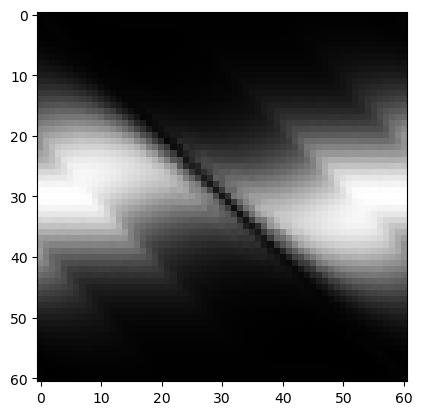

Downsampled shape: (61, 61, 5, 5, 3, 5, 9)


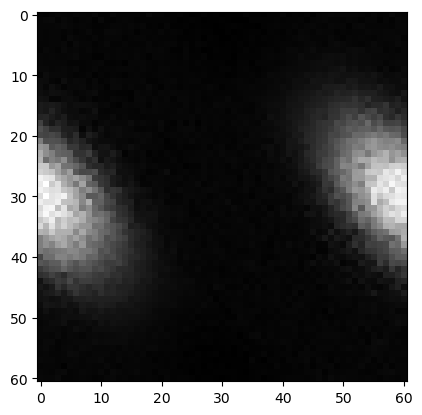

In [3]:
file_path = ppath / 'MF_1.mat'
with h5py.File(file_path, 'r') as file:
    # list all the keys in the root group
    print(list(file.keys()))
    # access a dataset
    meanfire1 = file['meanfire']
    print(meanfire1.shape)
    meanfire1 = np.array(meanfire1)
    print(meanfire1.shape)

# open the file in read mode
file_path = ppath / 'MF_2.mat'
with h5py.File(file_path, 'r') as file:
    # list all the keys in the root group
    print(list(file.keys()))
    # access a dataset
    meanfire2 = file['meanfire']
    print(meanfire2.shape)
    meanfire2 = np.array(meanfire2)[:,:,:,:,100:,:]
    print(meanfire2.shape)

# open the file in read mode
file_path = ppath / 'MF_5subj_full.mat'
with h5py.File(file_path, 'r') as file:
    # list all the keys in the root group
    print(list(file.keys()))
    # access a dataset
    meanfire3 = file['meanfire']
    print(meanfire3.shape)
    meanfire3 = np.array(meanfire3)[:,:,:,1:,:,:,:]
    print(meanfire3.shape)
    
plt.imshow(meanfire3[:,:, 2,2,0,1,1], cmap='gray')
plt.show()
# Calculate the target shape
target_shape = (meanfire2.shape[0], meanfire2.shape[1]) + meanfire3.shape[2:]
# Downsample the array to the target shape
meanfire3 = resize(meanfire3, target_shape, mode='reflect', anti_aliasing=True)
print("Downsampled shape:", meanfire3.shape)
plt.imshow(meanfire3[:,:, 2,3,0,1,1], cmap='gray')
plt.show()

In [4]:
textures = np.concatenate((meanfire1.reshape(meanfire1.shape[0], meanfire1.shape[1], -1),
                            meanfire2.reshape(meanfire2.shape[0], meanfire2.shape[1], -1),
                            meanfire3.reshape(meanfire3.shape[0], meanfire3.shape[1], -1)), axis=2)
print(textures.shape)
# for i in range(20):
#     plt.imshow(textures[:,:, i], cmap='gray')
#     plt.show()

(61, 61, 48375)


# Calculating Moran's I for the 2D CS interaction (just like for an image)

This calculates the Global Moran's I, a statistical measure of spatial autocorrelation.

What it measures: It tells you how similar a pixel is to its neighbors.

High positive value (towards +1): The image is spatially clustered or smooth. Similar values are grouped together (e.g., gradients, large blobs).

Negative value (towards -1): The image is dispersed (like a checkerboard).

Zero: The pixels are randomly distributed (noise).

Then, Filterring out CS interactions that only contains random, uniformly distributed predictios:
It looks for textures with very high spatial autocorrelation (> 0.95).
n_ix: This list will store the indices of images that are or structured, ie., meaningful predictions.

In [5]:
def morans_i(image):
    # Get the mean of the image
    mean_value = np.mean(image)
    # Calculate deviations from the mean
    deviation = image - mean_value
    # Get the number of rows and columns
    rows, cols = image.shape
    # Define the weight matrix (adjacency: 4-neighborhood)
    w = np.zeros((rows, cols, rows, cols))
    for i in range(rows):
        for j in range(cols):
            if i > 0:  # Up
                w[i, j, i-1, j] = 1
            if i < rows - 1:  # Down
                w[i, j, i+1, j] = 1
            if j > 0:  # Left
                w[i, j, i, j-1] = 1
            if j < cols - 1:  # Right
                w[i, j, i, j+1] = 1

    # Flatten arrays for calculation
    flat_deviation = deviation.flatten()
    flat_w = w.reshape(rows * cols, rows * cols)
    
    # Moran's I numerator
    numerator = np.dot(flat_deviation.T, np.dot(flat_w, flat_deviation))
    # Moran's I denominator
    denominator = np.sum(flat_deviation ** 2)
    # Moran's I calculation
    morans_i_value = (rows * cols / np.sum(flat_w)) * (numerator / denominator)
    
    return morans_i_value

Moran = np.zeros(textures.shape[2])
n_ix = []
for ix in range(textures.shape[2]):
    Moran[ix]= morans_i(textures[:,:,ix])
    if Moran[ix]>0.95:
        n_ix.append(ix)
print(len(Moran))
print(len(n_ix))
print(Moran)
print(n_ix)
# for ix in np.where(np.array(Moran[n_ix])<0.951)[0]:
#     print("Moran's I:", Moran[n_ix[ix]])
#     plt.imshow(textures[:,:,n_ix[ix]], cmap='gray')
#     plt.show()
# for i in range(500):
#     if Moran[i]>0.95:
#         print("Moran's I:", Moran[i])
#         plt.imshow(textures[:,:, i], cmap='gray')
#         plt.show()

48375
18489
[0.25375971 0.25886792 0.25052801 ... 0.78345521 0.92729352 0.94186797]
[9, 10, 11, 12, 13, 14, 15, 16, 17, 45, 46, 47, 48, 49, 50, 51, 52, 53, 58, 72, 73, 74, 75, 76, 77, 78, 79, 80, 90, 91, 92, 93, 94, 95, 96, 97, 98, 144, 145, 146, 147, 148, 149, 150, 151, 152, 183, 186, 187, 193, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 220, 221, 223, 224, 234, 235, 236, 237, 238, 239, 240, 241, 242, 252, 253, 254, 255, 256, 257, 258, 259, 260, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 348, 351, 352, 353, 354, 355, 356, 357, 358, 359, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 400, 401, 403, 404, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457

In [6]:
# 1. Save reference data
savename = ppath / "Moran_small.npy"
np.save(savename, Moran)
savename = ppath / "n_ix_small.npy"
np.save(savename, n_ix)

In [5]:
loadname = ppath / "Moran_small.npy"
Moran = np.load(loadname)
print(Moran.shape)
loadname = ppath / "n_ix_small.npy"
n_ix = np.load(loadname)
print(n_ix.shape)

(18489,)
(18489,)


# Correlation between the predictions

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


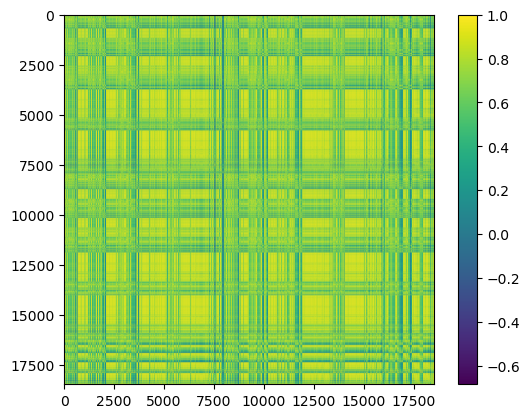

In [7]:
textures_small = textures[:,:,n_ix]
# 3. Calculate correlation on the small set
corr = np.corrcoef(textures_small.reshape(textures_small.shape[0]*textures_small.shape[1], textures_small.shape[2]).T)
plt.imshow(corr, cmap='viridis')
plt.colorbar()
plt.show()

In [8]:
#Moran scores
Moran_filtered = Moran[n_ix] 
print(len(Moran_filtered))

18489


# Grouping textures that are highly correlated with each other and keeps only the "best" one from each group (based on the Moran score)

final_ix ends up as a list of indices representing a subset of textures where:

No two textures have a correlation > 0.95 (mostly).
When a group of similar textures was found, the one with the highest Moran score was kept.

In [9]:
# 4. Filter Loop
include_sub_list = []
# Start with range of the NEW small dataset
final_ix = list(range(textures_small.shape[2])) 
for i in range(textures_small.shape[2]):
    if i in final_ix:
        sames_ix = list(np.where(corr[i,:] > 0.95)[0])
        if len(sames_ix) > 1:
            sames_m = Moran_filtered[sames_ix]
            max_m_ix = np.argmax(sames_m)
            winner = sames_ix[max_m_ix]
            
            final_set = set(final_ix)
            same_set = set(sames_ix)
            include_set = set(include_sub_list)
            
            # Protect items we already decided to keep
            common_items = list(final_set & include_set)
            if len(common_items) > 0:
                same_set = same_set - set(common_items)
            
            # Remove the cluster, add the winner
            final_ix = list(final_set - same_set)
            final_ix.append(winner)
            include_sub_list.append(winner)
# 5. FINAL CLEANUP (Remove the duplicates created by the append logic)
final_ix = sorted(list(set(final_ix)))
print(len(final_ix))

360


# Plotting the uncorrelated CS predictions

In [10]:
def plot_texture_grid(indices, texture_data, colormap):
    """
    Plots a grid of textures based on a list of indices.
    
    Args:
        indices: List of indices to plot (e.g., final_ix or keep_indices).
        texture_data: The 3D array of textures (rows, cols, n_images).
        colormap: The colormap to use for plotting.
    """
    N = len(indices)
    
    # Setup grid
    n_cols = int(np.ceil(np.sqrt(N)))
    n_rows = int(np.ceil(N / n_cols))
    
    # Create subplots
    _, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))
    ax = ax.flatten()
    
    # Store correlations for reference if needed
    local_corr = np.zeros(N)

    for p, pv in enumerate(indices):
        # Extract and Orient Image
        t = texture_data[:, :, pv]
        t = np.flip(t.T, axis=0)
        
        # Plot
        ax[p].imshow(t, cmap=colormap)
        
        # Clean up axes
        ax[p].spines["top"].set_visible(False)
        ax[p].spines["right"].set_visible(False)
        ax[p].set_xticks([])
        ax[p].set_yticks([])
        ax[p].grid(False)

        # Calculate symmetry correlation
        # Assuming texture width is at least ~60px based on slice [:30] and [31:]
        t1, t2 = t[:, :30], np.flip(t[:, 31:], axis=1)
        corr_val = np.corrcoef(t1.flatten(), t2.flatten())[0, 1]
        local_corr[p] = corr_val
        
        ax[p].set_title(f"C{p+1}: {np.round(corr_val, 2)}", fontsize=8)

    # Turn off unused subplots
    for i in range(N, len(ax)):
        ax[i].axis('off')

    plt.tight_layout()
    plt.show()

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


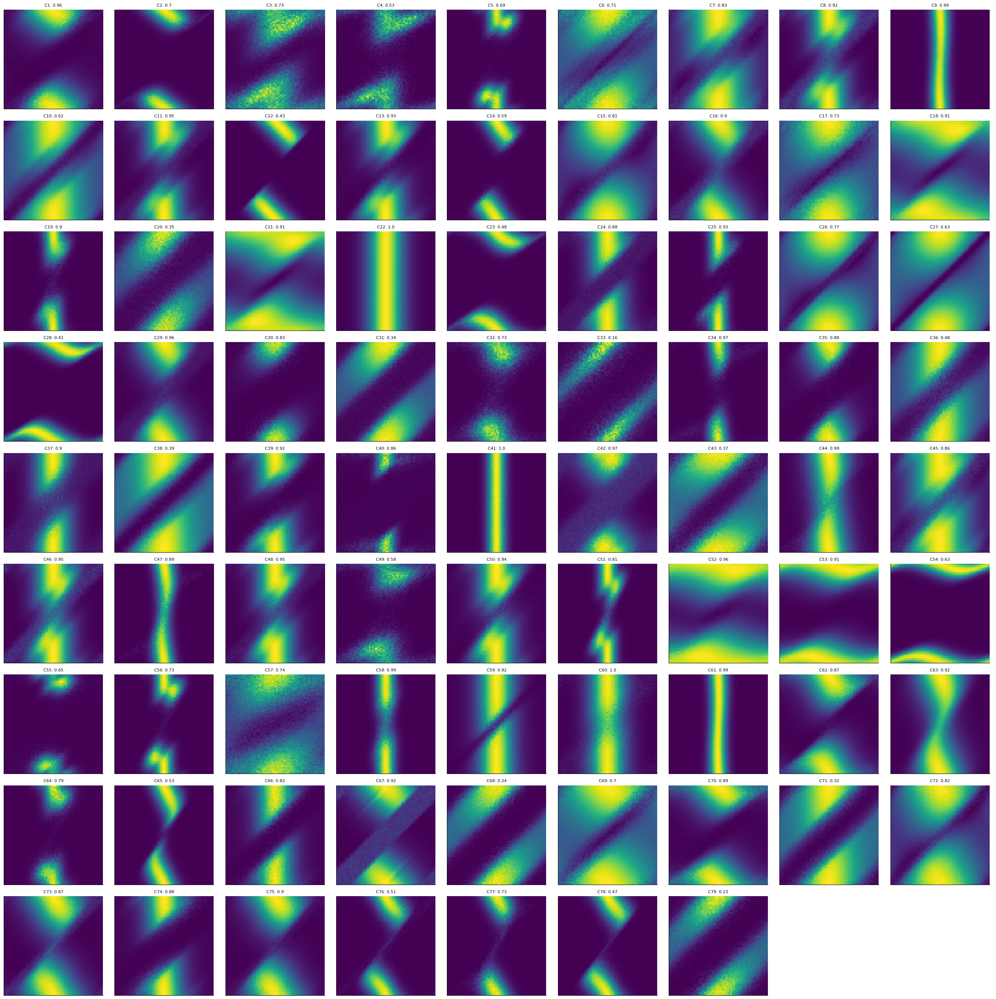

In [ ]:
plot_texture_grid(final_ix, textures_small, parula_map)

# Another filtering: finding groups of identical/similar images and keeps only the "best" one from each group.

In [11]:
# Define parameters
corr_threshold = 0.95 

# Note: ensure 'corr' is your correlation matrix and 'Moran_filtered' corresponds
# to the values for these specific textures.

keep_indices = []
checked = np.zeros(corr.shape[0], dtype=bool)

for i in range(corr.shape[0]):
    if not checked[i]:
        # 1. Find cluster: items that correlate > 0.95 with the current item 'i'
        high_corr_indices = np.where(corr[i] > corr_threshold)[0]
        
        # 2. Mark this whole cluster as "checked" so we don't process them again
        checked[high_corr_indices] = True
        
        # 3. Find the "Winner": The index in this cluster with the highest Moran score represents the group
        # Note: We look up the Moran score for each local index
        winner_local_idx = np.argmax(Moran_filtered[high_corr_indices])
        winner_global_idx = high_corr_indices[winner_local_idx]
        
        keep_indices.append(winner_global_idx)

# 4. Remove Duplicates:
# Because 'A' might be the winner for cluster 'B' and also cluster 'C', 
# it could appear twice. We fix this here.
keep_indices = sorted(list(set(keep_indices))) # set() removes duplicates, sorted() keeps order clean

# 5. Apply Filter
filtered_textures = textures_small[:, :, keep_indices]

print(f"Original number of images: {textures_small.shape[2]}")
print(f"Number of images after filtering: {filtered_textures.shape[2]}")

Original number of images: 18489
Number of images after filtering: 262


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


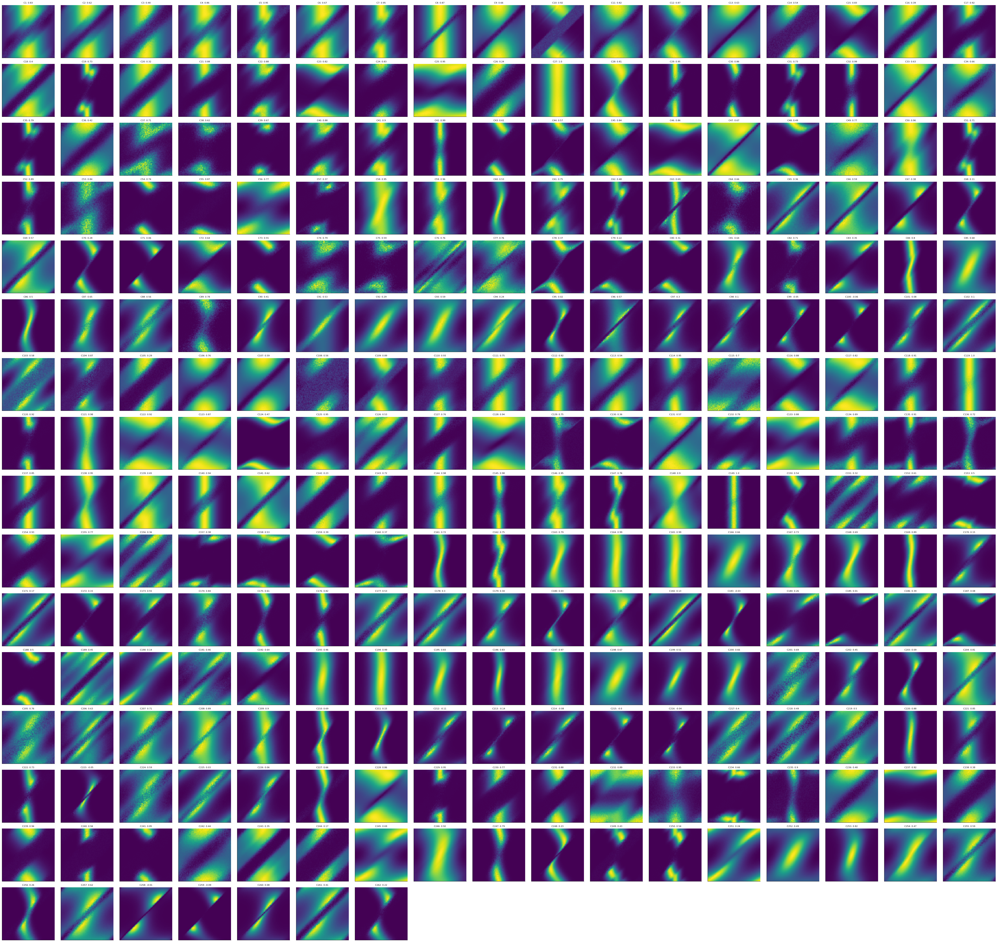

In [12]:
plot_texture_grid(keep_indices, textures_small, parula_map)

# Choosing a few indices by hand

In [25]:

#cluster_ix = [1, 2, 3, 4,9,14,15,18,19,20,21,23,33,36,38,40,42,45,54,55,74,79,80,81,86,89,93,97,99,117,124,132,138,140,141,154,157,158,160,163,175,176,178,180,182,186,191,192,199, 201, 223,225,229,231,233,239,246,250,265,272,279,281,287,293]
cluster_ix = [2, 3, 9,15,19,20,21,33,40,42,45,54,55,79,81,89,117,132,140,141,154,158,163,176,178,180,186,192,201,223,231,239,246]
print(len(cluster_ix))

33


In [26]:
# 1. Calculate Correlations first
corrp = np.zeros(len(cluster_ix))
for p, pv in enumerate(cluster_ix):
    t = filtered_textures[:,:,pv]
    t = np.flip(t.T, axis=0) # Orient image
    
    # Calculate symmetry correlation
    # Assuming standard 61px width (0-29, 30center, 31-60)
    t1, t2 = t[:, :30], np.flip(t[:, 31:], axis=1)
    corrp[p] = np.corrcoef(t1.flatten(), t2.flatten())[0, 1]


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [27]:
def plot_cluster_grid(filtered_textures, cluster_ix, colormap, f_font1, f_font2, n_cols=16):
    """
    Plots a sorted grid of selected textures with correlations and custom ticks.
    
    Args:
        filtered_textures: 3D array of textures (H, W, N_total)
        cluster_ix: List of indices to plot
        colormap: Matplotlib colormap
        f_font1: Font dict for axis labels
        f_font2: Font dict for titles
        n_cols: Number of columns in the grid (default 16)
    """
    
    # 1. Calculate Correlations for sorting
    corrp = np.zeros(len(cluster_ix))
    for p, pv in enumerate(cluster_ix):
        t = filtered_textures[:,:,pv]
        t = np.flip(t.T, axis=0) # Standard orientation fix
        
        # Calculate symmetry correlation
        # Assumes width ~61 (0-29, 30, 31-60)
        t1, t2 = t[:, :30], np.flip(t[:, 31:], axis=1)
        corrp[p] = np.corrcoef(t1.flatten(), t2.flatten())[0, 1]

    # 2. Setup Grid
    N = len(cluster_ix)
    n_rows = int(np.ceil(N / n_cols))
    
    # Dynamic figsize: ~1.5 per inch per subplot
    figS_local = 2 # Scaling factor
    _, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols * figS_local, n_rows * figS_local))
    ax = ax.flatten()

    # Ticks configuration
    tckix = [0, 30, 60]
    tckval = ["-180", "0", "180"]
    tckvaly = ["180", "0", "-180"]

    # 3. Sort and Plot
    sorted_indices = np.argsort(corrp) # Sort by correlation

    for p, v_idx in enumerate(sorted_indices):
        original_idx = cluster_ix[v_idx]
        
        t = filtered_textures[:, :, original_idx]
        t = np.flip(t.T, axis=0)
        
        ax[p].imshow(t, cmap=colormap)
        
        # Clean Spines
        ax[p].spines["top"].set_visible(False)
        ax[p].spines["right"].set_visible(False)
        ax[p].grid(False)
        
        # Title
        ax[p].set_title(f"#{p+1}: {np.round(corrp[v_idx], 2)}", **f_font2)

        # --- Dynamic Label Logic ---
        row = p // n_cols
        col = p % n_cols
        
        # Y-Axis: Only for the first column
        if col == 0:
            ax[p].yaxis.set_ticks(tckix)
            ax[p].yaxis.set_ticklabels(tckvaly, **f_font1)
        else:
            ax[p].yaxis.set_ticks([])
            
        # X-Axis: Only for the bottom-most plot in each column
        # Check if the plot below this one would be out of bounds (N) or on a new grid
        if row == n_rows - 1:
            ax[p].xaxis.set_ticks(tckix)
            ax[p].xaxis.set_ticklabels(tckval, **f_font1)
        else:
            ax[p].xaxis.set_ticks([])

        # Apply Fonts to Ticks
        for labl in (ax[p].get_xticklabels() + ax[p].get_yticklabels()):
            labl.set_fontname(f_font1["fontname"])
            labl.set_fontsize(f_font1["size"])

    # 4. Cleanup Unused Subplots
    for i in range(N, len(ax)):
        ax[i].axis('off')

    plt.tight_layout()
    plt.show()

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


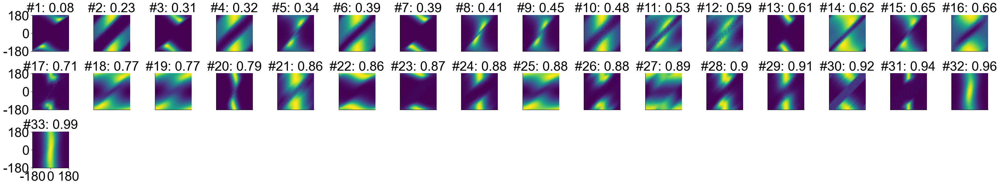

In [28]:
plot_cluster_grid(filtered_textures, cluster_ix, parula_map, f_font1, f_font2)

In [29]:
from sklearn.cluster import KMeans
# 1. Prepare Data: Flatten images to (N_samples, N_features)
# filtered_textures shape is (H, W, 262) -> We need (262, H*W)
n_images = filtered_textures.shape[2]
flat_data = filtered_textures.reshape(-1, n_images).T 
# 2. Run K-Means to find exactly 64 groups
target_n = 64
kmeans = KMeans(n_clusters=target_n, random_state=42, n_init=10).fit(flat_data)
# 3. Find the image closest to the center of each cluster
cluster_ix = []
for i in range(target_n):
    # Get indices of all images in this cluster
    members = np.where(kmeans.labels_ == i)[0]
    
    # Calculate distance of each member to the cluster center
    distances = np.linalg.norm(flat_data[members] - kmeans.cluster_centers_[i], axis=1)
    
    # Pick the one closest to the center (the most "prototypical" one)
    winner = members[np.argmin(distances)]
    cluster_ix.append(winner)
cluster_ix = sorted(cluster_ix)
print(f"Selected {len(cluster_ix)} distinct images from {n_images}.")


Selected 64 distinct images from 262.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


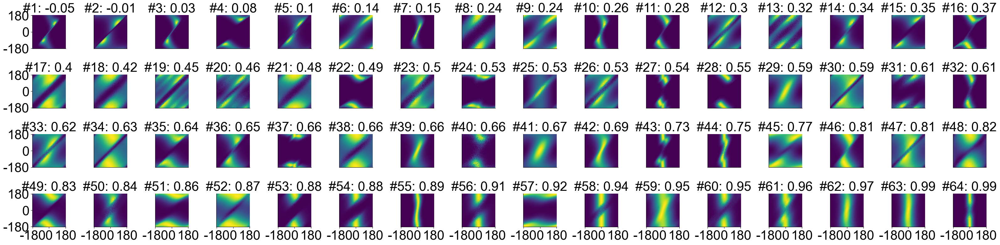

In [30]:
plot_cluster_grid(filtered_textures, cluster_ix, parula_map, f_font1, f_font2)

# Clustering CS predictions using clustering on autoencoder latent representations - NOT used in the final article

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

from scipy.spatial.distance import cdist
#from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN

In [38]:


class ConvAutoencoder(nn.Module):
    def __init__(self, k1, k2, k3, out1, out2, out3):
        super(ConvAutoencoder, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, out1, k1, stride=2, padding=1), # Adjust input channels as needed
            nn.ReLU(),
            nn.Conv2d(out1, out2, k2, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(out2, out3, k3)
        )
        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(out3, out2, k3),
            nn.ReLU(),
            nn.ConvTranspose2d(out2, out1, k2, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(out1, 1, k1, stride=2, padding=1, output_padding=0), # Adjust output channels as needed
            nn.Sigmoid() # Assuming input textures are normalized [0, 1]
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded


In [39]:
tensor_textures = torch.tensor(textures).float()
dataset = TensorDataset(tensor_textures)
dataloader = DataLoader(dataset, batch_size=10, shuffle=True)

# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

k1, k2, k3, out1, out2, out3 = 3, 3, 7, 16, 32, 64
def train_model(k1, k2, k3, out1, out2, out3, nE, dataloader, device):
    model = ConvAutoencoder(k1, k2, k3, out1, out2, out3).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Training loop
    num_epochs = nE # Adjust as needed
    for epoch in range(num_epochs):
        for data in dataloader:
            inputs, = data
            #print(inputs.shape)
            optimizer.zero_grad()
            _, decoded = model(inputs)
            #print(decoded.shape)
            loss = criterion(decoded, inputs)
            loss.backward()
            optimizer.step()
        print(f'Epoch {epoch+1}, Loss: {loss.item()}')
    return model

def extract_features_kmean(model, dataloader, nC, rS, textures):
    # Use the trained encoder to extract features
    model.eval()
    features = []
    with torch.no_grad():
        for data in dataloader:
            inputs, = data
            encoded, _ = model(inputs)
            #print(encoded.shape)
            features.append(encoded.view(encoded.size(0), -1).cpu().numpy())
    sh = encoded.shape
    features = np.concatenate(features, axis=0)
    #print(features.shape)
    # Perform k-means clustering
    kmeans = KMeans(n_clusters=nC, random_state=rS).fit(features)
    # Calculate the distance of each feature to each cluster center
    distances = cdist(features, kmeans.cluster_centers_, 'euclidean')
    # Find the index of the closest sample to each cluster center
    closest_indices = np.argmin(distances, axis=0)
    # Use these indices to select the representative textures from the original dataset
    representative_textures = [textures[i] for i in closest_indices]
    categories = kmeans.predict(features)
    return kmeans, representative_textures, sh, distances, categories

def extract_features_hc(model, dataloader, textures, dT):
    # Use the trained encoder to extract features
    model.eval()
    features = []
    with torch.no_grad():
        for data in dataloader:
            inputs, = data
            encoded, _ = model(inputs)
            #print(encoded.shape)
            features.append(encoded.view(encoded.size(0), -1).cpu().numpy())
    sh = encoded.shape
    features = np.concatenate(features, axis=0)
    #print(features.shape)
    # Perform hierarchical clustering clustering
    clustering = AgglomerativeClustering(distance_threshold=dT, n_clusters=None).fit(features)
    categories = clustering.labels_
    cluster_centers = np.array([features[categories == i].mean(axis=0) for i in np.unique(categories)])
    # Calculate the distance of each feature to each cluster center
    distances = cdist(features, cluster_centers, 'euclidean')
    # Find the index of the closest sample to each cluster center
    closest_indices = np.argmin(distances, axis=0)
    # Use these indices to select the representative textures from the original dataset
    representative_textures = [textures[i] for i in closest_indices]
    return clustering, representative_textures, sh, distances, categories, cluster_centers

def extract_features_dbsc(model, dataloader, textures, eps, min_samples):
    # Use the trained encoder to extract features
    model.eval()
    features = []
    with torch.no_grad():
        for data in dataloader:
            inputs, = data
            encoded, _ = model(inputs)
            #print(encoded.shape)
            features.append(encoded.view(encoded.size(0), -1).cpu().numpy())
    sh = encoded.shape
    features = np.concatenate(features, axis=0)
    #print(features.shape)
    # Perform DBSCAN clustering
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(features)
    # DBSCAN labels for the dataset
    categories = dbscan.labels_
    # Number of clusters
    n_clusters_ = len(set(categories)) - (1 if -1 in categories else 0) 
    cluster_centers = np.array([features[categories == i].mean(axis=0) for i in range(n_clusters_)])
    # Calculate the distance of each feature to each cluster center
    distances = cdist(features, cluster_centers, 'euclidean')
    # Find the index of the closest sample to each cluster center
    closest_indices = np.argmin(distances, axis=0)
    # Use these indices to select the representative textures from the original dataset
    representative_textures = [textures[i] for i in closest_indices]
    return dbscan, representative_textures, sh, distances, categories, cluster_centers

def generate_textures(kmeans, model, sh, device, cc=None):
    if cc is None:
        cc = kmeans.cluster_centers_
    # Assuming `model` is your trained model and it has a decoder that can take latent space representations
    model.eval()
    generated_textures = []
    with torch.no_grad():
        for center in cc:
            # Reshape and convert the cluster center to a tensor
            #print(center.shape)
            center_tensor = torch.tensor(center, dtype=torch.float32).view(sh[1], sh[2], sh[3])  # Adjust shape as necessary
            center_tensor = center_tensor.to(device)  # If using GPU
            # Decode the center tensor to get the generated texture
            generated_texture = model.decoder(center_tensor)
            T = np.squeeze(generated_texture.cpu().numpy())
            #plt.imshow(T, cmap='gray')
            #plt.show()
            generated_textures.append(T)
    return generated_textures

In [40]:
# Assuming `features` is the array of encoded features from your dataset
# and `kmeans` is your trained KMeans model

k1, k2, k3, out1, out2, out3 = 3, 6, 9, 16, 32, 64
m = train_model(k1, k2, k3, out1, out2, out3, 50, dataloader, device)


Epoch 1, Loss: 0.03379681333899498
Epoch 2, Loss: 0.019602768123149872
Epoch 3, Loss: 0.01663074642419815
Epoch 4, Loss: 0.009246078319847584
Epoch 5, Loss: 0.010656382888555527
Epoch 6, Loss: 0.005589342210441828
Epoch 7, Loss: 0.005532803945243359
Epoch 8, Loss: 0.0022664861753582954
Epoch 9, Loss: 0.0018698741914704442
Epoch 10, Loss: 0.0021481073927134275
Epoch 11, Loss: 0.003124917158856988
Epoch 12, Loss: 0.0010636999504640698
Epoch 13, Loss: 0.0014915184583514929
Epoch 14, Loss: 0.0021384782157838345
Epoch 15, Loss: 0.0023623628076165915
Epoch 16, Loss: 0.0017356289317831397
Epoch 17, Loss: 0.0009064506739377975
Epoch 18, Loss: 0.001110919052734971
Epoch 19, Loss: 0.0013186142314225435
Epoch 20, Loss: 0.0005974043160676956
Epoch 21, Loss: 0.0009946669451892376
Epoch 22, Loss: 0.0007407558732666075
Epoch 23, Loss: 0.001707281800918281
Epoch 24, Loss: 0.0005084418226033449
Epoch 25, Loss: 0.000544946116860956
Epoch 26, Loss: 0.0006576768937520683
Epoch 27, Loss: 0.0006474734982475

In [43]:
# save pytorch model
torch.save(m, sp+'ClusterModel_sample.pth')

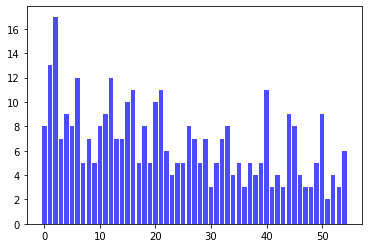

(array([], dtype=int64),)


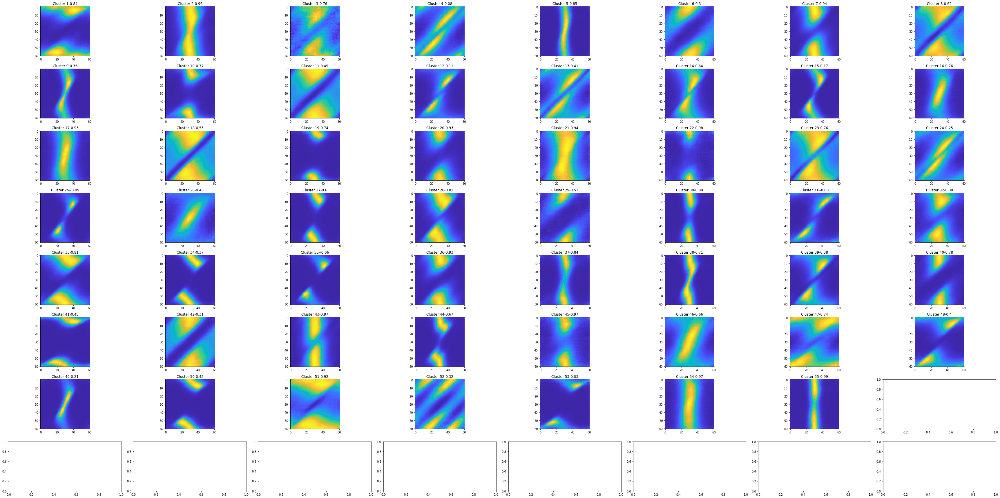

In [46]:
for i in [60]:

    k,texts,sh,dist,c,cc = extract_features_hc(m, dataloader, textures, i)
    T = generate_textures(k, m, sh, device,cc)
    np.unique(c)
    n = np.array([sum(c==j) for j in np.unique(c)])
    plt.bar(range(len(np.unique(c))), n, color='blue', alpha=0.7)
    plt.show()
    print(np.where(n>100))
    _, ax = plt.subplots(8, 8, figsize=(figS*8, figS*4))
    #ix = [3,5,7,8,9,14,15,17,18,20,22,23,24,26,27,28,30,32,33,34]
    corrp = np.zeros(len(T))
    ax = ax.ravel()
    for p in range(len(T)):
        t = T[p]

        t = np.flip(t.T, axis=0)
        ax[p].imshow(t,cmap=parula_map)
        ax[p].spines["top"].set_visible(False)
        ax[p].spines["right"].set_visible(False)

        ax[p].grid(False)

        t1,t2 = t[:,:30],np.flip(t[:,31:], axis=1)
        corrp[p] = np.corrcoef(t1.flatten(), t2.flatten())[0,1]
        ax[p].set_title("Cluster "+str(p+1)+"-"+str(np.round(corrp[p],2)))
    plt.tight_layout()
    #plt.savefig(sp+"firing_base_pred"+str(mi)+".pdf")
    plt.show()

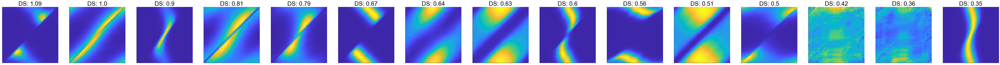

In [ ]:
ix = np.argsort(corrp)[:15]
_, ax = plt.subplots(1, 15, figsize=(figS*15, figS))
ax = ax.ravel()
for p in range(len(ix)):
    t = np.flip(T[ix[p]].T, axis=0)
    ax[p].imshow(t,cmap=parula_map)
    ax[p].spines["top"].set_visible(False)
    ax[p].spines["right"].set_visible(False)

    ax[p].grid(False)
    ax[p].xaxis.set_ticks([])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax[p].yaxis.set_ticks([])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    #above = 1 if n[p]>100 else 0
    ax[p].set_title("DS: "+str(np.round(1-corrp[ix[p]],2)), **f_font1)
#plt.tight_layout()
plt.savefig(sp+"clusters_hc.pdf")
plt.show()

In [ ]:

n1 = len(T)
corrp = np.zeros(n1)
for p in range(n1):
    t = T[p]
    t1,t2 = t[:,:45],np.flip(t[:,46:], axis=1)
    corrp[p] = np.corrcoef(t1.flatten(), t2.flatten())[0,1]

In [ ]:
corrp

array([ 0.77336199, -0.02593694,  0.20657502,  0.97080348,  0.89773046,
        0.99209842,  0.94927349,  0.49745044,  0.95477781,  0.89612634,
        0.42373418,  0.43967899,  0.66353474,  0.77392504,  0.92417271,
        0.74696131,  0.89860505,  0.92303472,  0.96138417,  0.77360762,
        0.74458299,  0.7836729 ,  0.84367121,  0.50388195,  0.95530626,
        0.65810443,  0.75313029,  0.11148578,  0.99736285,  0.94982615,
        0.76234457,  0.85489218,  0.4147433 ,  0.07290138,  0.65255386,
        0.98818097])

In [ ]:
n1,n2,n3 = len(T), meanfire.shape[2], meanfire.shape[4]*meanfire.shape[5]*meanfire.shape[6]
corr = np.zeros((n1, n2*n2, n3))
RMSE = np.zeros((n1, n2*n2, n3))
for p in range(n1):
    t = T[p]
    j=0
    for ss in range(5):
        for cs in range(5):
            fr = meanfire[:,:,ss,cs,:,:,:]
            fr = fr.reshape(91,91,-1)
            fr = fr.reshape(91*91,-1).T
            fr_ = np.array(t.reshape(91*91))
            #print(fr.shape, fr_.shape)
            corr[p,j,:] = np.corrcoef(fr, fr_)[0,1:]
            RMSE[p,j,:] = np.sqrt(np.mean((fr - fr_)**2, axis=1))
            j+=1

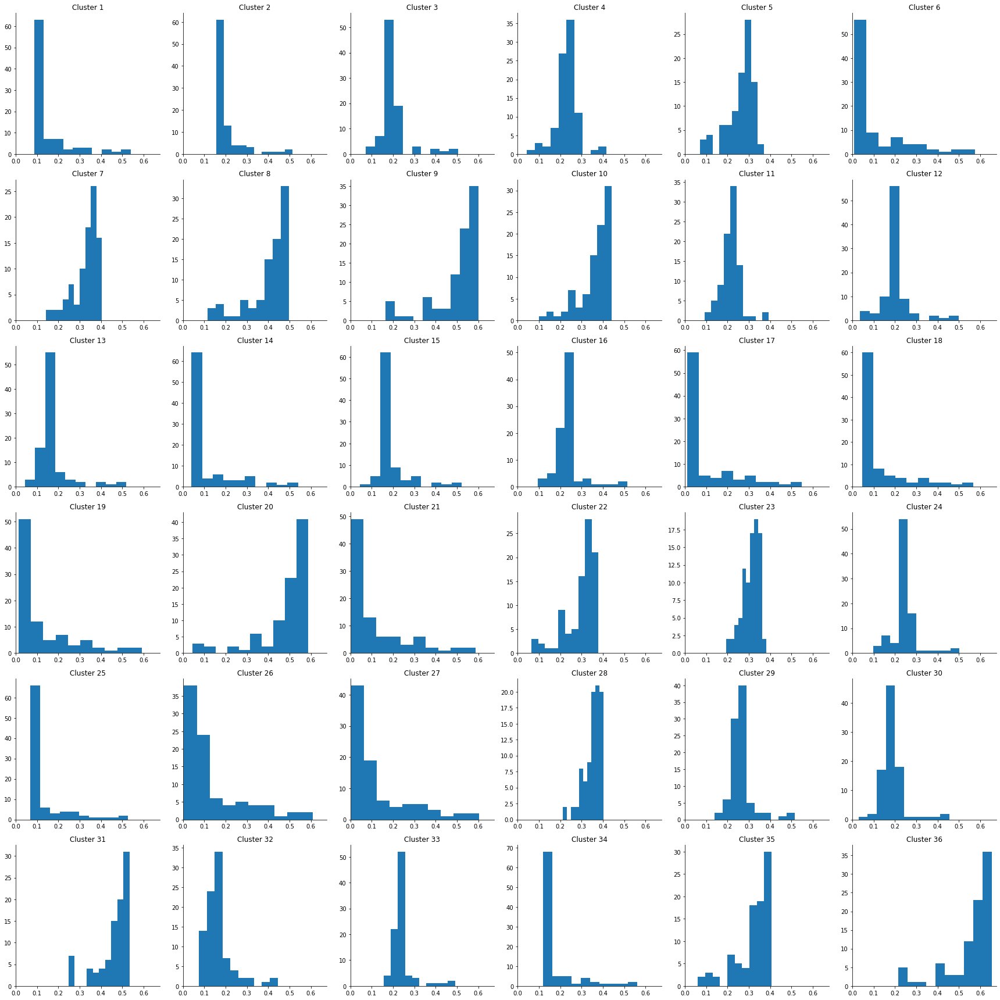

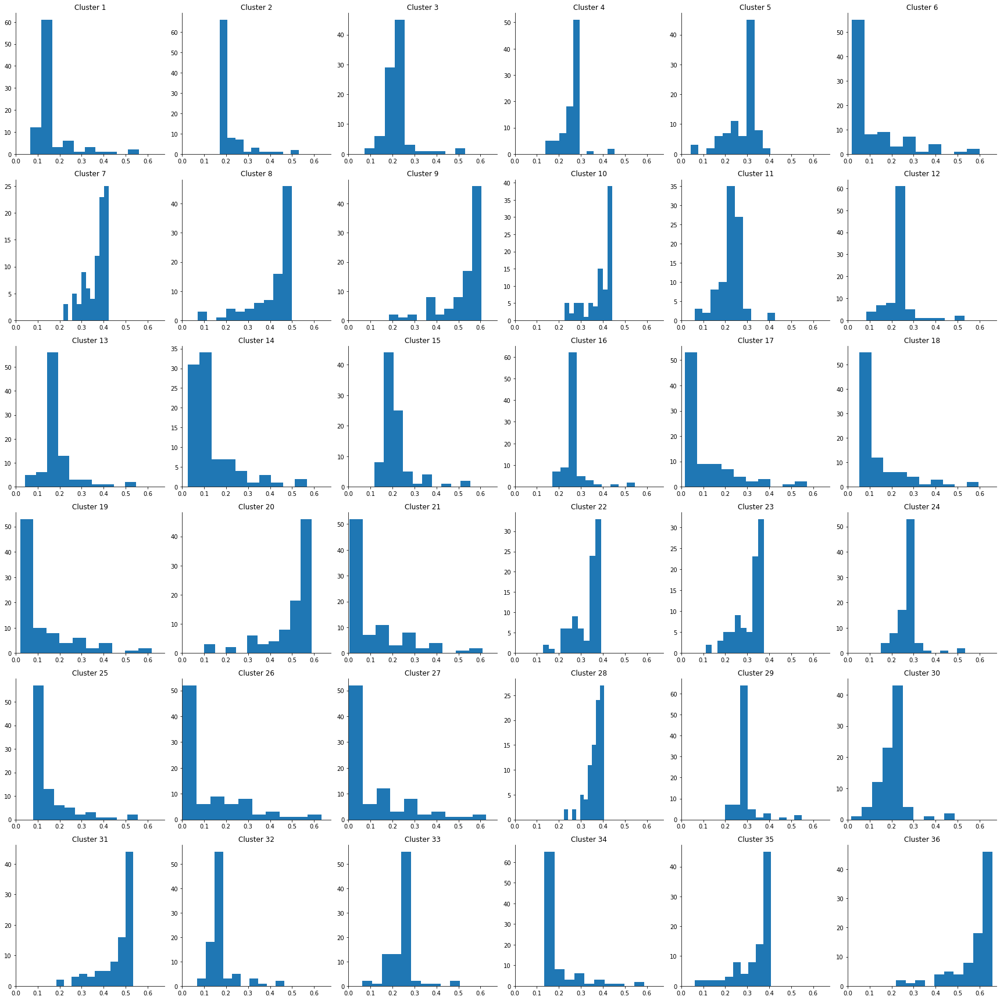

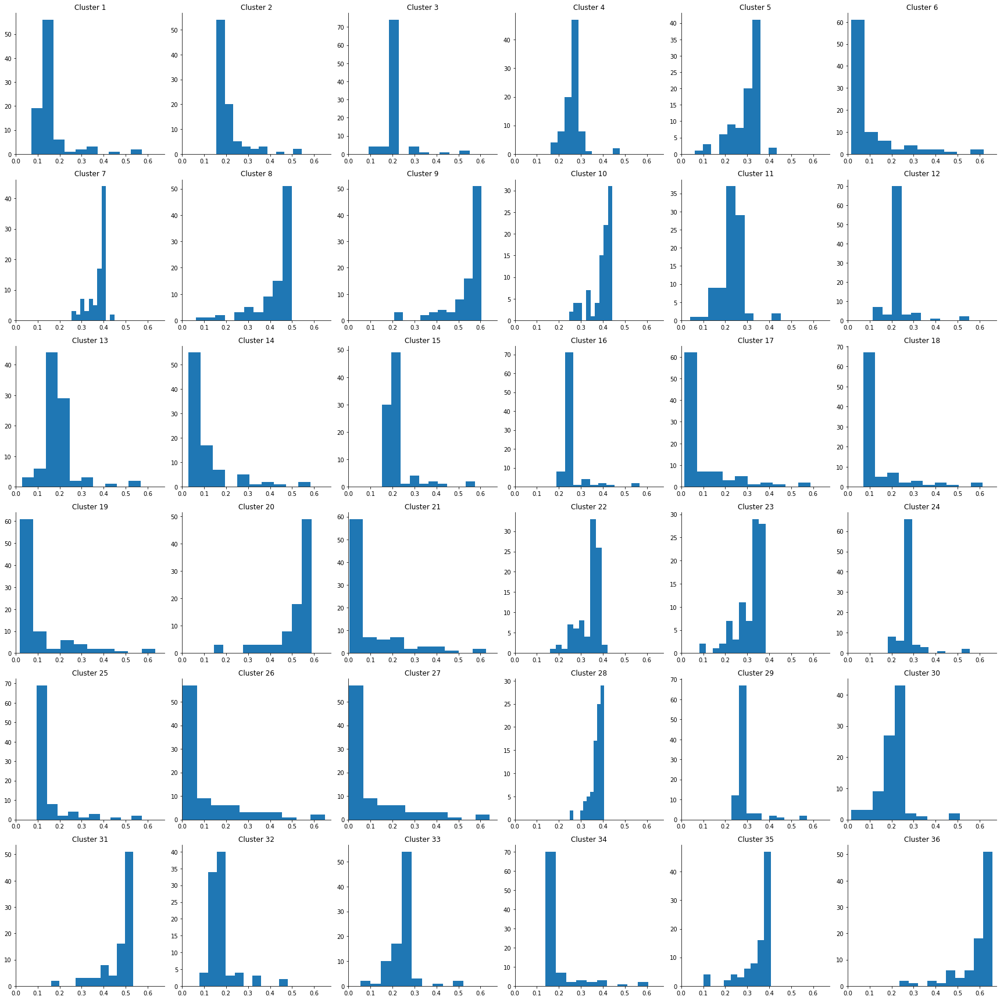

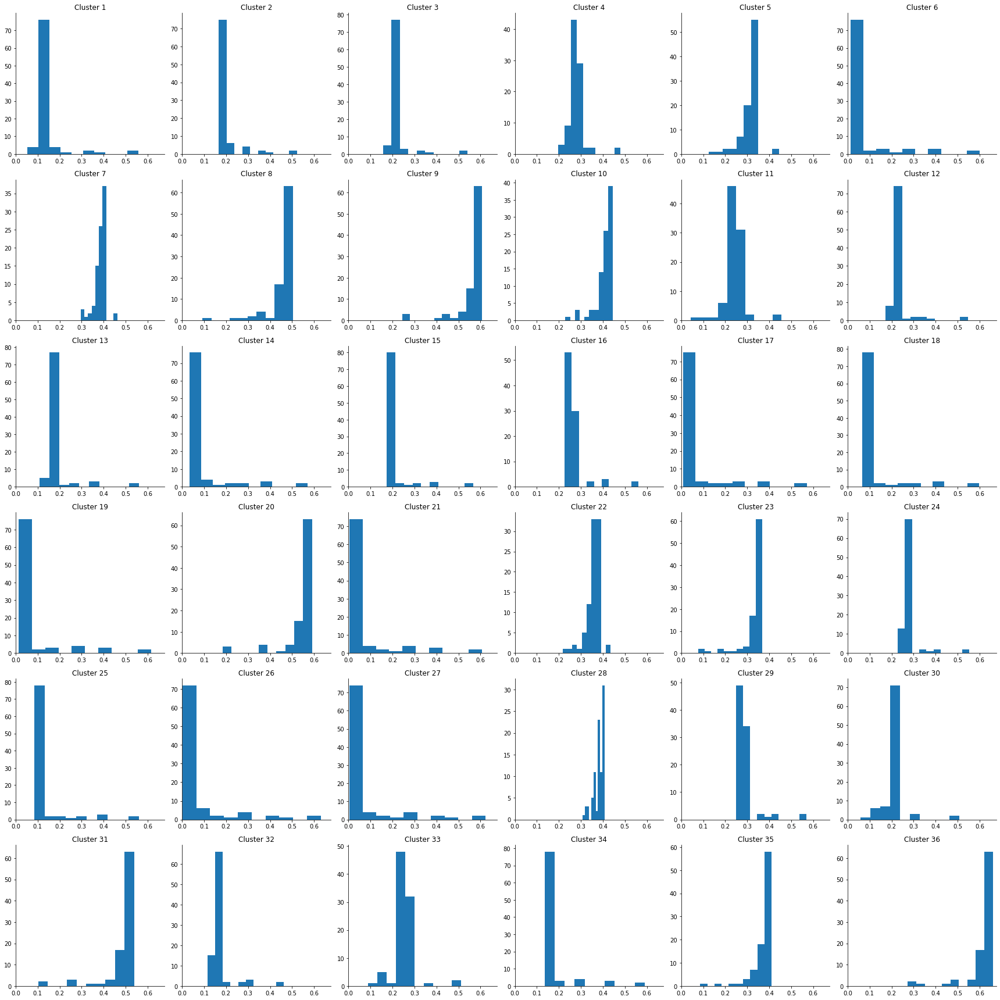

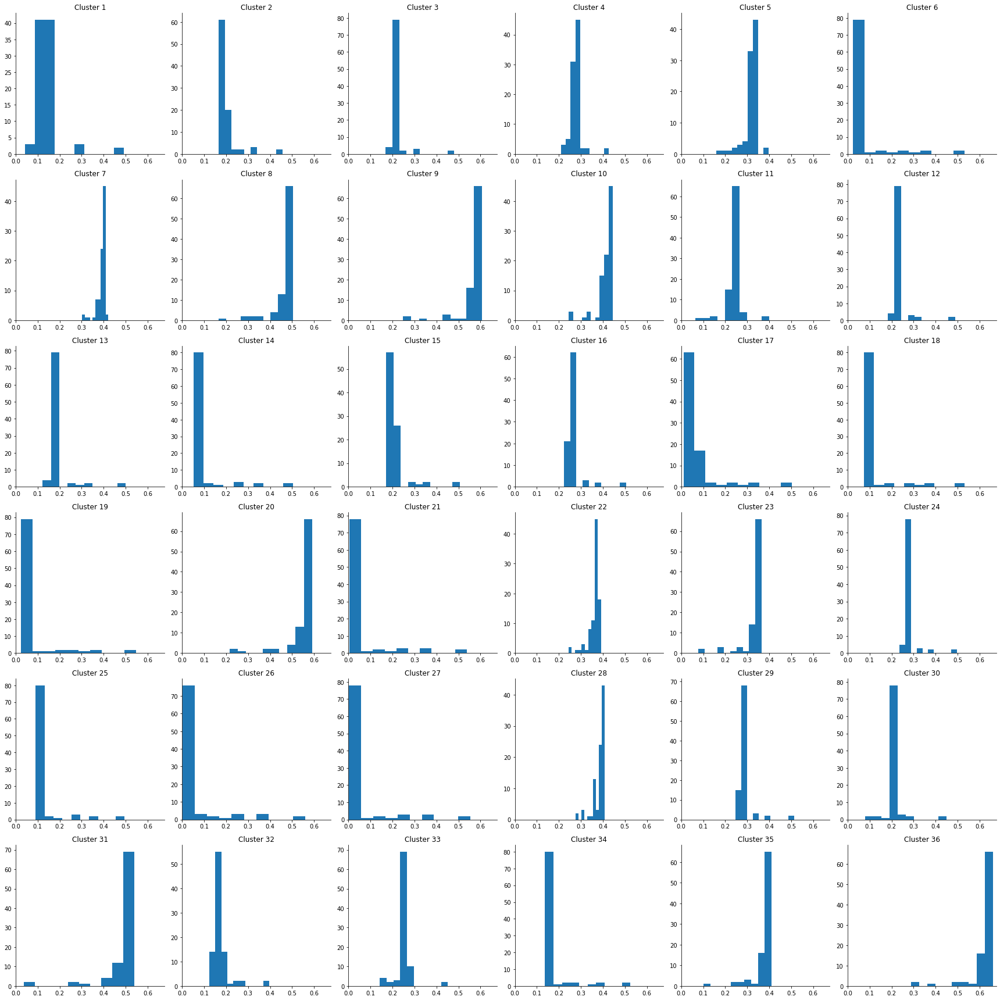

...

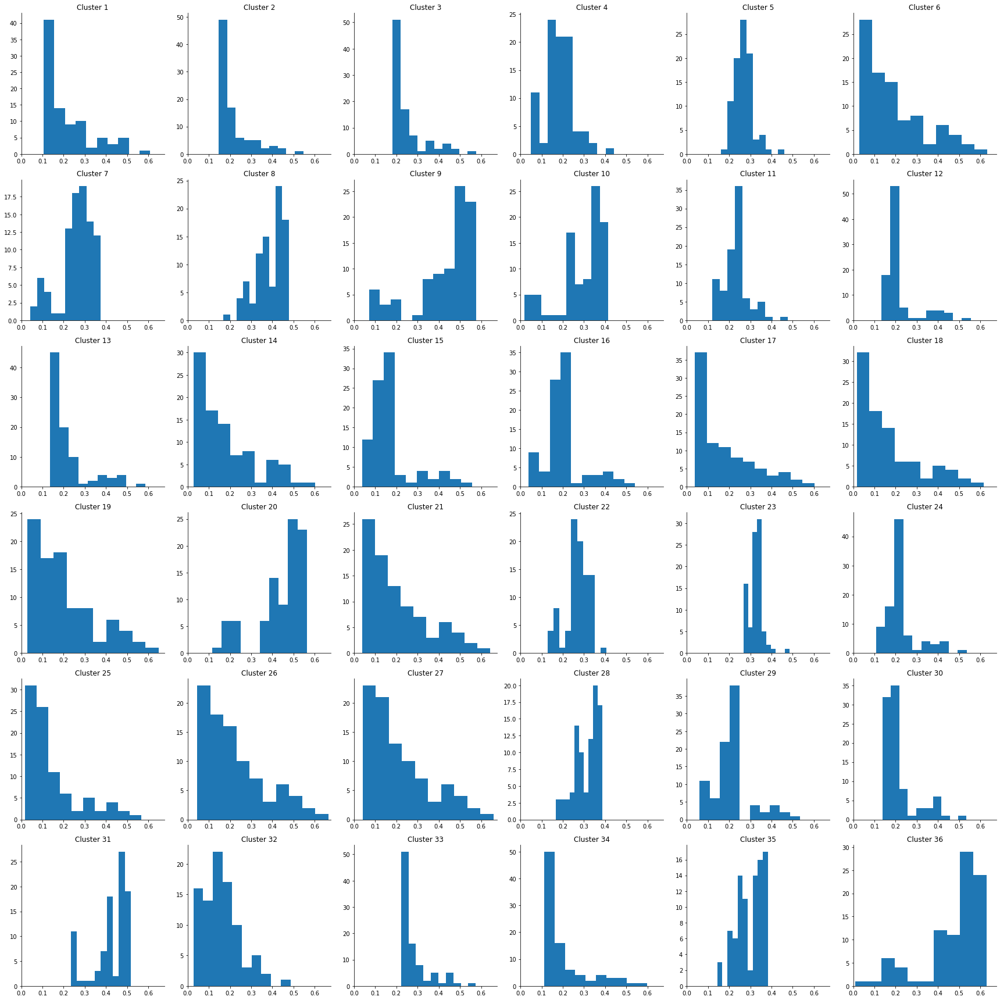

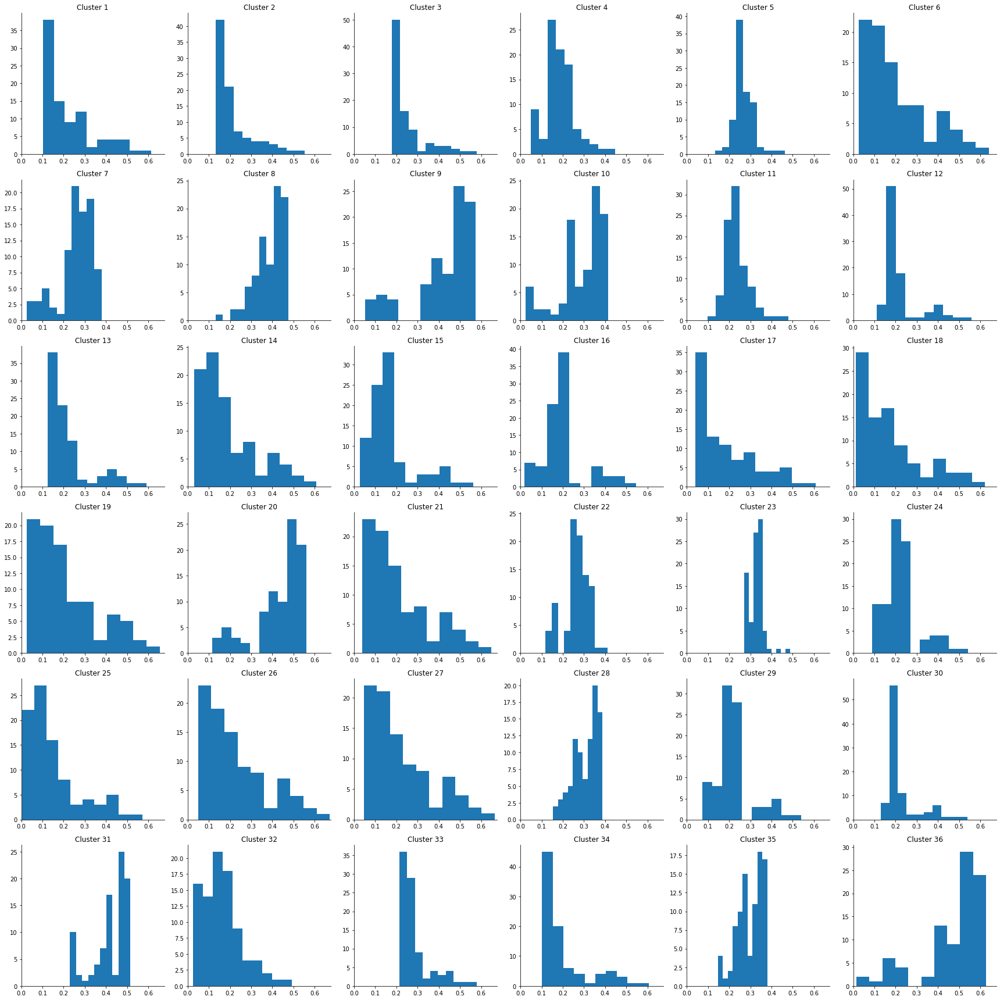

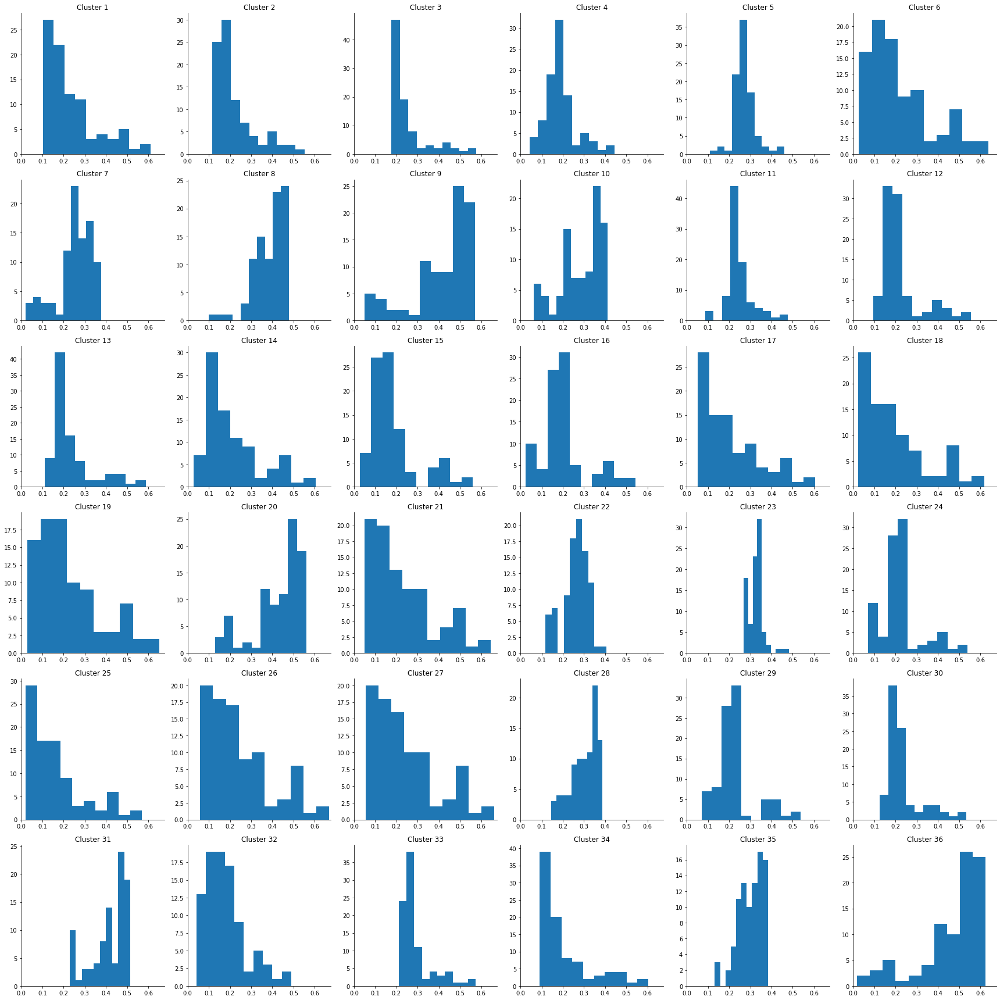

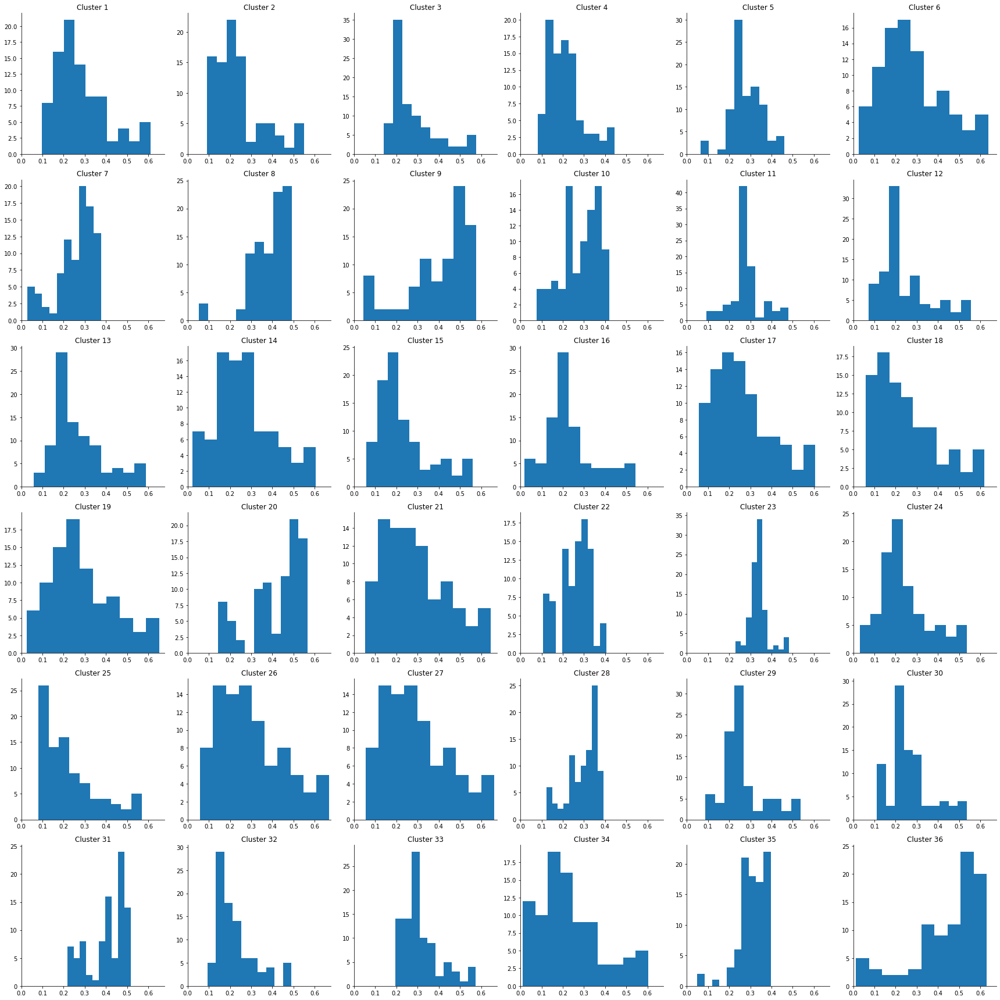

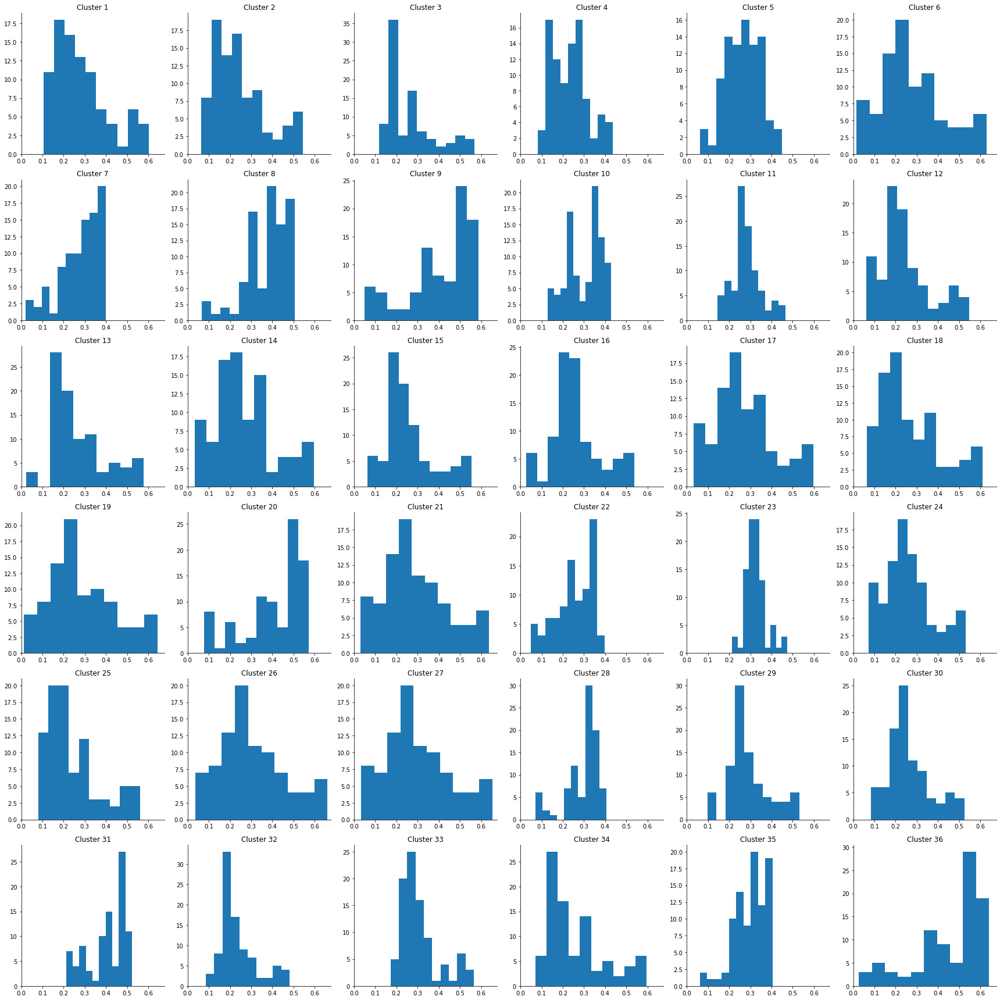

In [ ]:
for ss in range(5):
        for cs in range(5):
                _, ax = plt.subplots(6, 6, figsize=(figS*4, figS*4))
                ax = ax.ravel()
                for p in range(n1):
                    ax[p].hist(RMSE[p,ss,cs,:], bins=10)
                    ax[p].spines["top"].set_visible(False)
                    ax[p].spines["right"].set_visible(False)
                    ax[p].set_xlim([0, np.max(RMSE)])
                    ax[p].grid(False)
                    ax[p].set_title("Cluster "+str(p+1))
                plt.tight_layout()
                plt.show()

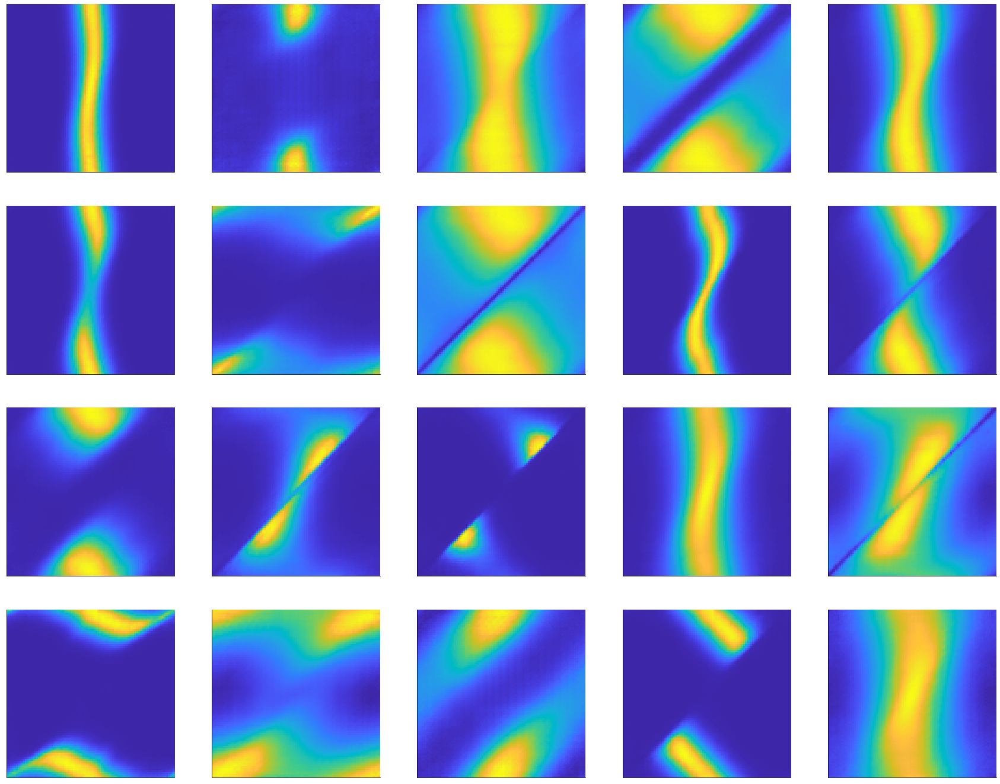

In [ ]:
ix = [3,5,7,8,9,14,15,17,18,20,22,23,24,26,27,28,30,32,33,34]
_, ax = plt.subplots(4, 5, figsize=(figS*5, figS*4))
ax = ax.ravel()
for p in range(len(ix)):
    t = np.flip(T[ix[p]].T, axis=0)
    ax[p].imshow(t,cmap=parula_map)
    ax[p].spines["top"].set_visible(False)
    ax[p].spines["right"].set_visible(False)

    ax[p].grid(False)
    ax[p].xaxis.set_ticks([])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    ax[p].yaxis.set_ticks([])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    #above = 1 if n[p]>100 else 0
    #ax[p].set_title("Cluster "+str(p+1)+"-"+str(above))
#plt.tight_layout()
plt.savefig(sp+"clusters.pdf")
plt.show()

In [ ]:
k,texts,sh,dist,c,cc = extract_features_dbsc(m, dataloader, textures, 1, 50)
T = generate_textures(k, m, sh, device,cc)
np.unique(c)

ValueError: XB must be a 2-dimensional array.

In [ ]:
n = np.array([sum(c==j) for j in np.unique(c)])
plt.bar(range(len(np.unique(c))), n, color='blue', alpha=0.7)
plt.show()
print(np.where(n>100))
_, ax = plt.subplots(6, 5, figsize=(figS*1.7, figS*1.5))
ax = ax.ravel()
for p in range(len(T)):
    t = T[p]
    ax[p].imshow(t)
    ax[p].spines["top"].set_visible(False)
    ax[p].spines["right"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    #ax.spines["bottom"].set_visible(False)
    #ax.spines["left"].set_visible(False)
    ax[p].grid(False)
    # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    #     label.set_fontname(f_font1["fontname"])
    #     label.set_fontsize(35)
    #ax.xaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    #ax.yaxis.set_ticks([-4,0,4])
    #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
    #ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
    #ax.set_xlim(-4.1, 4.1)
    #ax.set_ylim(-4.1, 4.1)
    #plt.tick_params(top=False, bottom=False, left=False, right=False,
    #                labelleft=False, labelbottom=False)
    above = 1 if n[p]>100 else 0
    ax[p].set_title("Cluster "+str(p+1)+"-"+str(above))
plt.tight_layout()
#plt.savefig(sp+"firing_base_pred"+str(mi)+".pdf")
plt.show()

In [47]:
Tk=[]
D = []
C = []
for r in range(5):
    print(r)
    k,texts,sh,dist,c = extract_features_kmean(m, dataloader, 36, r, textures)
    Tk.append(generate_textures(k, m, sh, device))
    D.append(dist)
    C.append(c)

0
1
2
3
4


In [48]:
len(Tk)

5

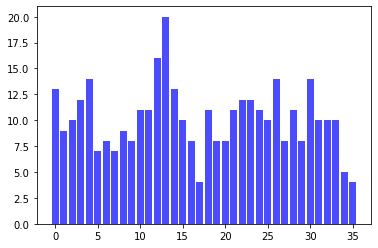

(array([], dtype=int64),)


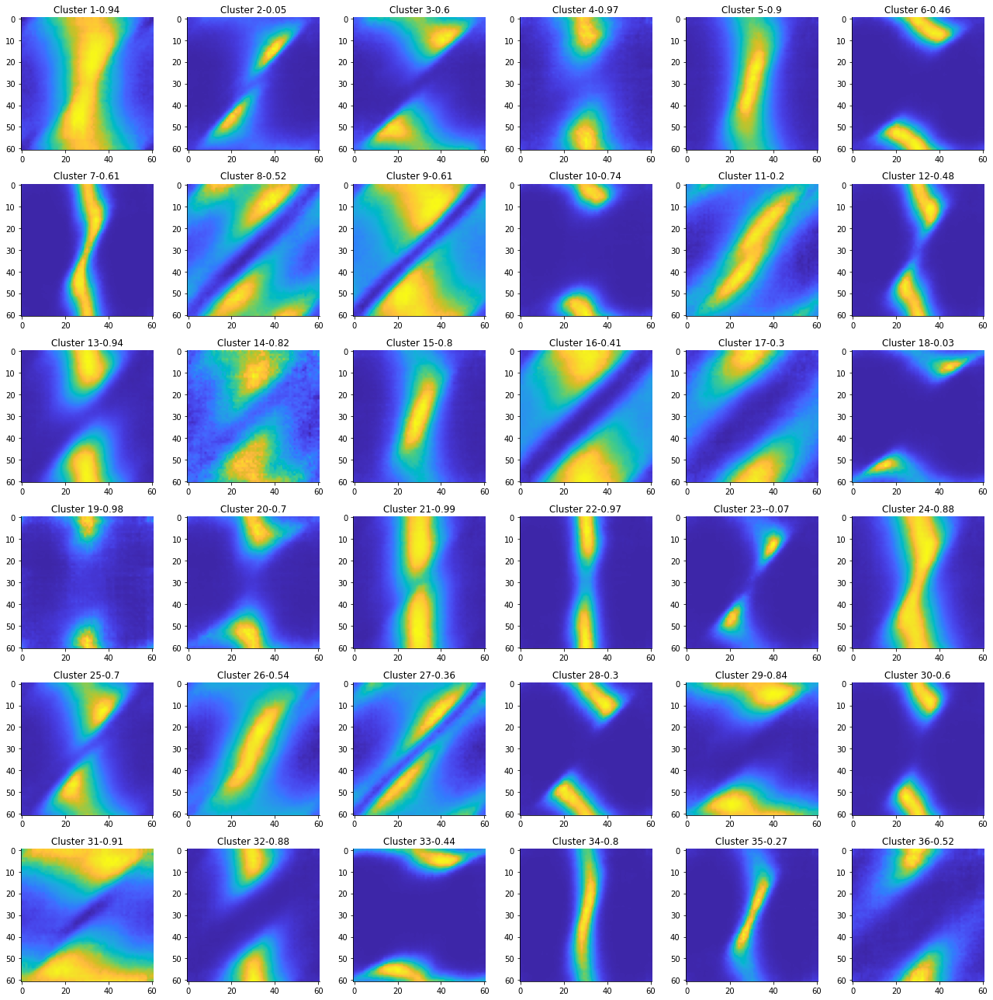

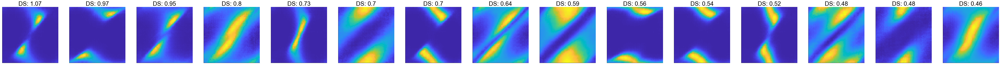

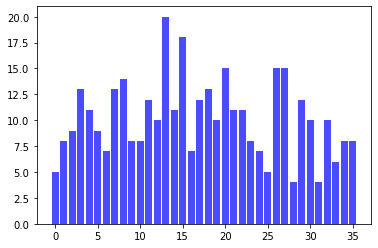

(array([], dtype=int64),)


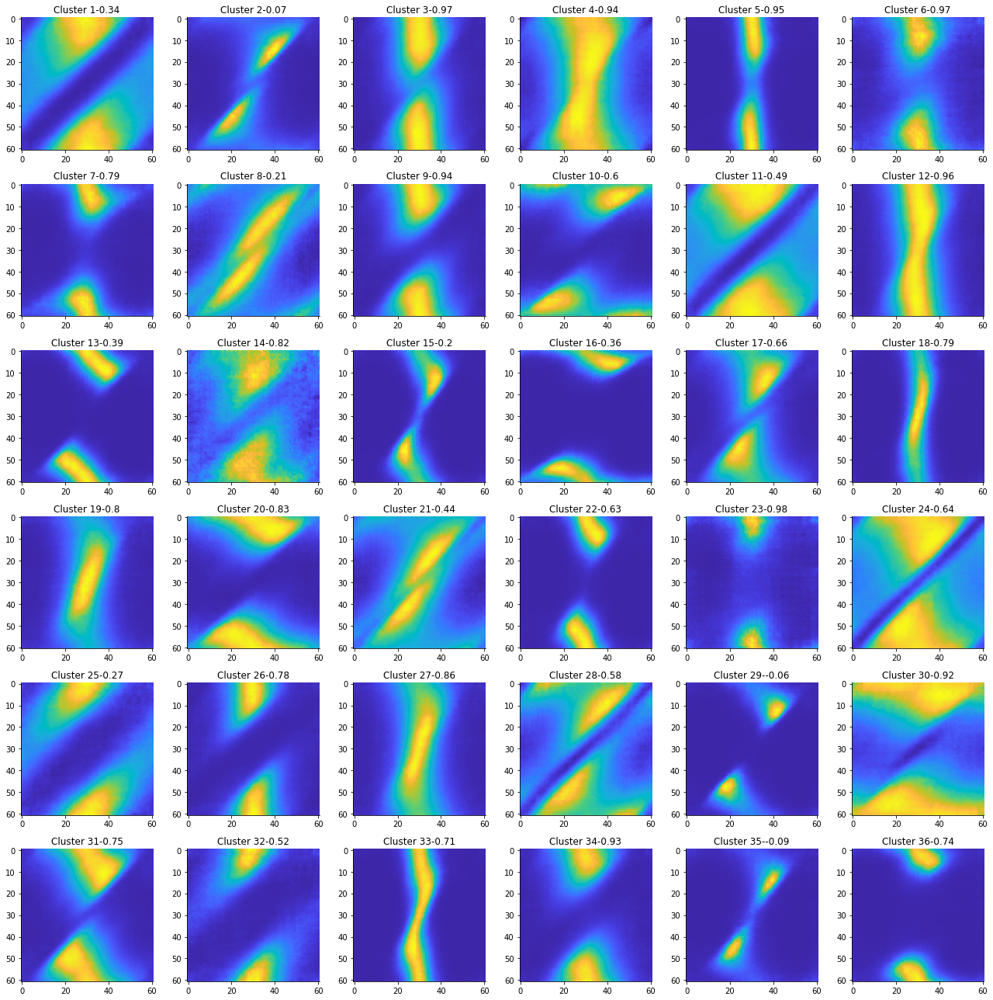

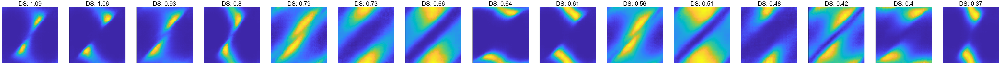

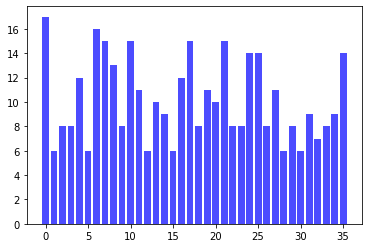

(array([], dtype=int64),)


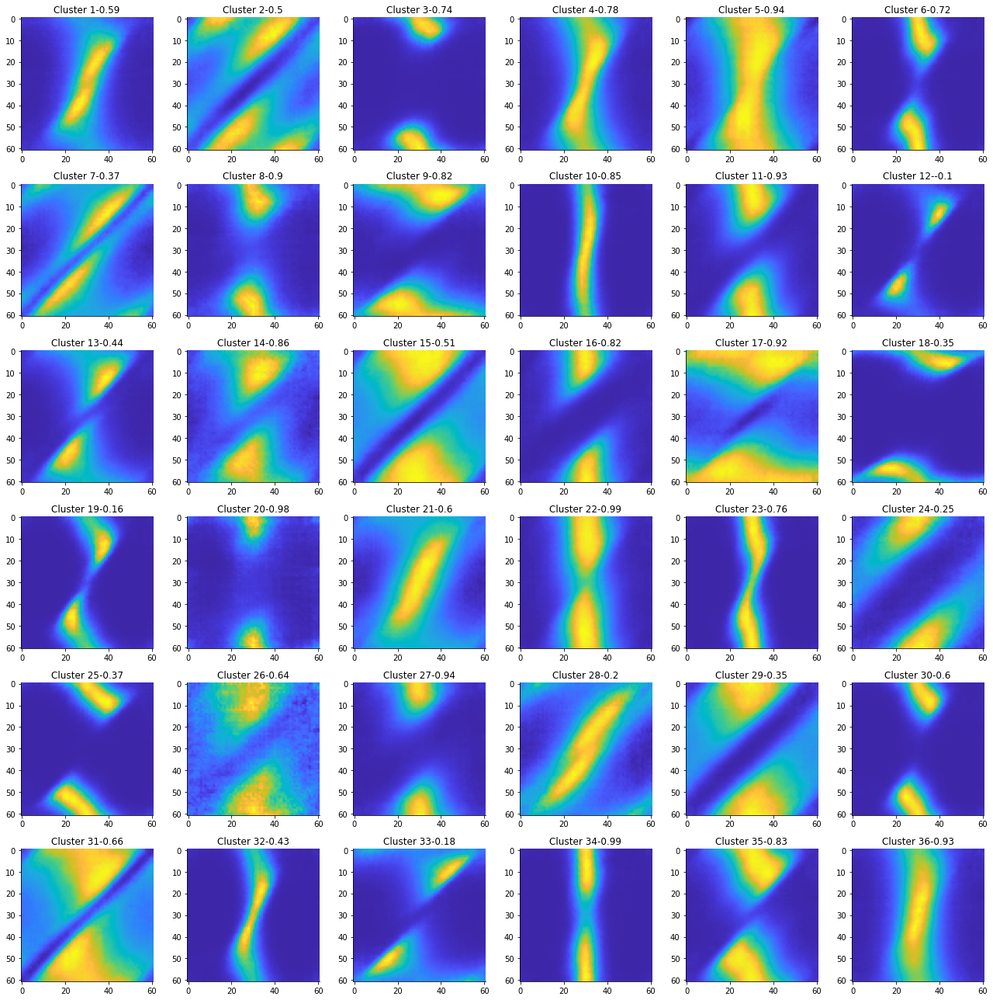

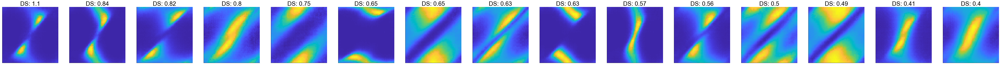

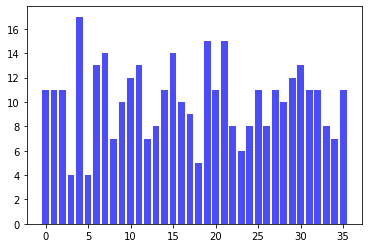

(array([], dtype=int64),)


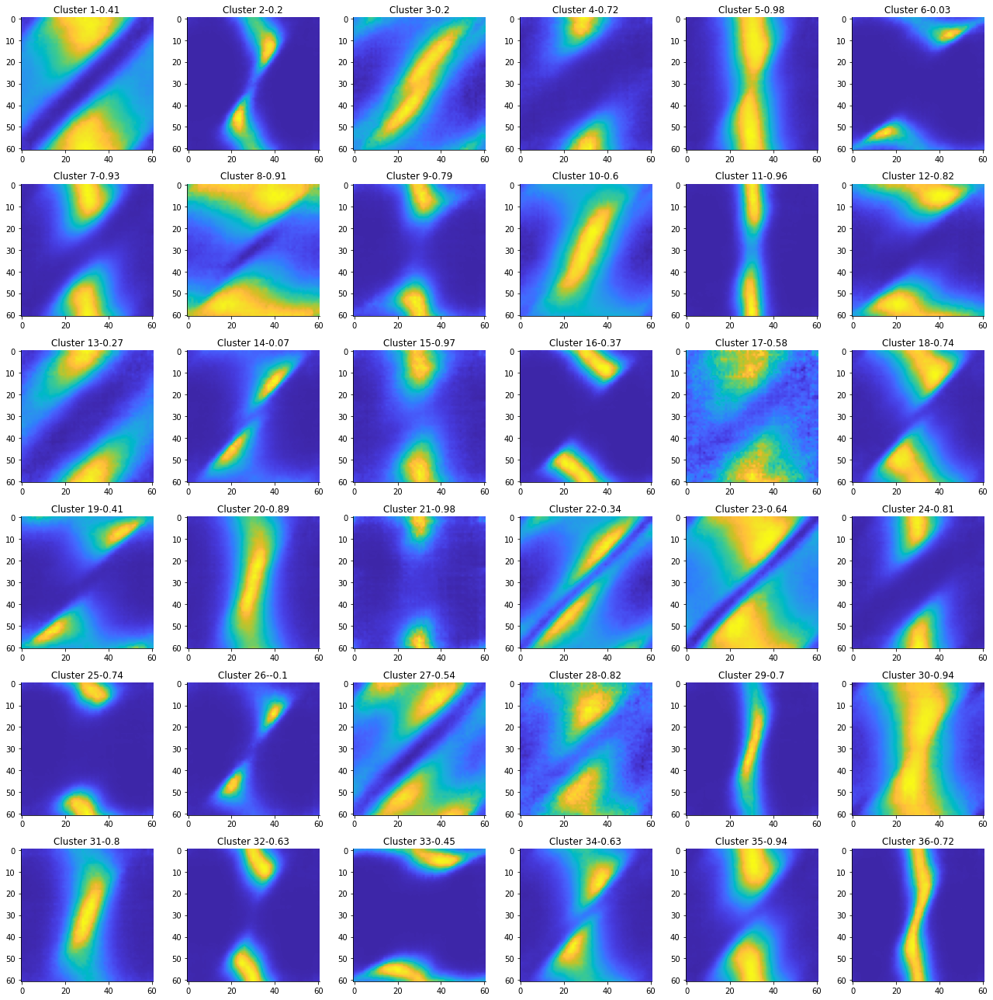

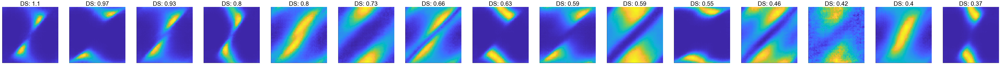

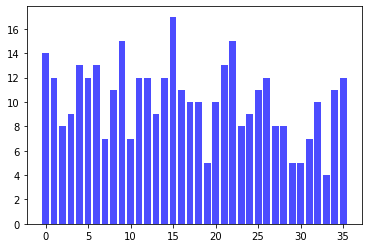

(array([], dtype=int64),)


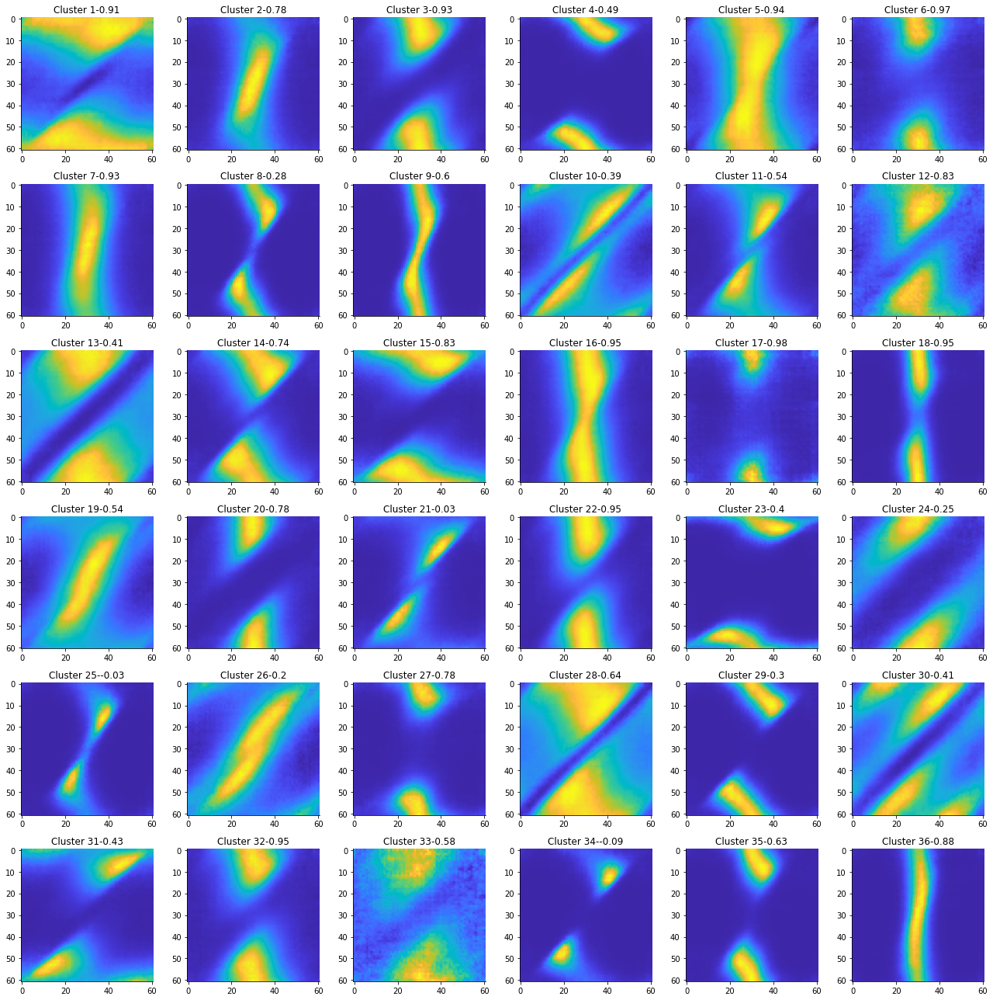

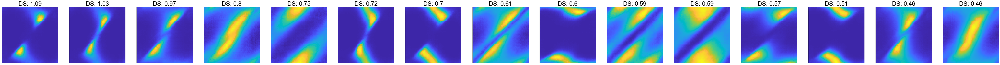

In [49]:
for i in range(5):
    n = np.array([sum(C[i]==j) for j in np.unique(C[i])])
    plt.bar(range(len(np.unique(C[i]))), n, color='blue', alpha=0.7)
    plt.show()
    print(np.where(n>100))
    _, ax = plt.subplots(6, 6, figsize=(figS*3, figS*3))
    ax = ax.ravel()
    corrp = np.zeros(len(Tk[i]))
    for p in range(len(Tk[i])):
        t = np.flip(Tk[i][p].T, axis=0)
        ax[p].imshow(t,cmap=parula_map)
        ax[p].spines["top"].set_visible(False)
        ax[p].spines["right"].set_visible(False)
        #ax.spines["left"].set_visible(False)
        #ax.spines["bottom"].set_visible(False)
        #ax.spines["left"].set_visible(False)
        ax[p].grid(False)
        # for label in (ax.get_xticklabels()+ax.get_yticklabels()):
        #     label.set_fontname(f_font1["fontname"])
        #     label.set_fontsize(35)
        #ax.xaxis.set_ticks([-4,0,4])
        #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
        #ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
        #ax.yaxis.set_ticks([-4,0,4])
        #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
        #ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
        #ax.set_xlim(-4.1, 4.1)
        #ax.set_ylim(-4.1, 4.1)
        #plt.tick_params(top=False, bottom=False, left=False, right=False,
        #                labelleft=False, labelbottom=False)
        t1,t2 = t[:,:30],np.flip(t[:,31:], axis=1)
        corrp[p] = np.corrcoef(t1.flatten(), t2.flatten())[0,1]
        ax[p].set_title("Cluster "+str(p+1)+"-"+str(np.round(corrp[p],2)))
    plt.tight_layout()
    #plt.savefig(sp+"firing_base_pred"+str(mi)+".pdf")
    plt.show()

    ix = np.argsort(corrp)[:15]
    _, ax = plt.subplots(1, 15, figsize=(figS*15, figS))
    ax = ax.ravel()
    for p in range(len(ix)):
        t = np.flip(Tk[i][ix[p]].T, axis=0)
        ax[p].imshow(t,cmap=parula_map)
        ax[p].spines["top"].set_visible(False)
        ax[p].spines["right"].set_visible(False)

        ax[p].grid(False)
        ax[p].xaxis.set_ticks([])
        #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
        #ax.xaxis.set_ticklabels(["0","0.5","1"], **f_font1)
        ax[p].yaxis.set_ticks([])
        #ax.yaxis.set_ticks([0,0.1,0.2,0.3, 0.4])
        #ax.yaxis.set_ticklabels(["0","0.5","1"], **f_font1)
        #above = 1 if n[p]>100 else 0
        ax[p].set_title("DS: "+str(np.round(1-corrp[ix[p]],2)), **f_font1)
    #plt.tight_layout()
    #plt.savefig(sp+"clusters_km"+str(i)+".pdf")
    plt.show()

In [ ]:
np.savez(sp+"kmean_36cluster_data.npz", Tk=Tk, D=D, C=C)